In [128]:
#initial Coding - https://www.kaggle.com/code/tabarkarajab/satellite-images-using-transfer-learning
#Understand Explaiability - https://github.com/jaydeep-work/LIME-SAM/blob/main/Keras_example.ipynb

In [46]:
#import libraries
import os
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import geopandas as gpd
import contextily as cx
from keras.preprocessing import image
import tensorflow as tf

from skimage.io import imread
from skimage.util import montage
from tqdm import tqdm

In [47]:
# tqdm.pandas() is used to apply the progress_apply method to track the progress of pandas operations.
# It's used with the .progress_apply() method to show a progress bar during operations like apply.
tqdm.pandas()

# The lambda function montage_rgb is defined to create a montage of RGB images.
# It takes a 4D NumPy array representing a batch of images and returns a single RGB image.
montage_rgb = lambda x, **kwargs: np.stack([montage(x[:, :, :, i], **kwargs) for i in range(x.shape[3])], -1)


In [52]:
# Print the current working directory
%pwd

'/Users/murad/Downloads/DeepLearning'

In [53]:
# List detailed information about files and directories in the specified path
!ls -lha ../Input/satellite-images-of-hurricane-damage

total 24
drwxr-xr-x  7 murad  staff   224B Dec  3 21:20 .
drwxr-xr-x@ 4 murad  staff   128B Nov 13 21:36 ..
-rw-r--r--@ 1 murad  staff   8.0K Dec  6 17:58 .DS_Store
drwxr-xr-x@ 5 murad  staff   160B Nov 26 17:36 test
drwxr-xr-x@ 5 murad  staff   160B Dec  1 14:04 test_another
drwxr-xr-x@ 5 murad  staff   160B Nov 21 20:10 train_another
drwxr-xr-x@ 5 murad  staff   160B Dec  1 13:20 validation_another


python(16712) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


In [54]:
def get_file_size(file_path):
    """Gives the size of a file in megabytes."""
    return round(os.path.getsize(file_path) / 1000000, 2)

def print_file_sizes(input_path, subset):
    """
    Print file sizes for a specified directory subset.

    Args:
    - input_path : The base path of the dataset.
    - subset : A specific subset within the dataset.
    """
    # Display the subset label
    print(f'{subset}:')
    print('')
    
    # Create the full path for the specified subset
    path = os.path.join(input_path, subset)
    
    # Iterate through files and directories in the subset
    for folder in os.listdir(path):
        entry_path = os.path.join(path, folder)
        
        if os.path.isfile(entry_path):
            # If it's a file, print its name and size in megabytes
            print(f'{folder.ljust(30)}{get_file_size(entry_path)}MB')
        elif os.path.isdir(entry_path):
            # If it's a directory, calculate and print the total size and the number of files
            sizes = [get_file_size(os.path.join(entry_path, x)) for x in os.listdir(entry_path)]
            total_size = round(sum(sizes), 2)
            print(f'{folder.ljust(30)}{total_size}MB ({len(sizes)} files)')
    
    print('')

# Example usage of the function for different subsets
input_path = '../Input/satellite-images-of-hurricane-damage/'

print_file_sizes(input_path, 'train_another')
print_file_sizes(input_path, 'validation_another')
print_file_sizes(input_path, 'test_another')
print_file_sizes(input_path, 'test')


train_another:

.DS_Store                     0.01MB
no_damage                     0.04MB (5000 files)
damage                        0.07MB (5000 files)

validation_another:

.DS_Store                     0.01MB
no_damage                     0.0MB (1000 files)
damage                        0.01MB (1000 files)

test_another:

.DS_Store                     0.01MB
no_damage                     0.0MB (1000 files)
damage                        0.09MB (8000 files)

test:

.DS_Store                     0.01MB
no_damage                     0.0MB (1000 files)
damage                        0.01MB (1000 files)



In [55]:
# Create a DataFrame with the paths of JPEG and JPG files in the specified directory and its subdirectories
image_df = pd.DataFrame({'path': list(Path(input_path).glob('**/*.jp*g'))})


# Extract the 'damage' label from the parent directory of each image
image_df['damage'] = image_df['path'].map(lambda x: x.parent.stem)

# Extract the 'data_split' label from the parent's parent directory of each image
image_df['data_split'] = image_df['path'].map(lambda x: x.parent.parent.stem)

# Extract the 'location' label from the filename stem of each image
image_df['location'] = image_df['path'].map(lambda x: x.stem)

# Extract the longitude and latitude from the 'location' label and create separate 'lon' and 'lat' columns
image_df['lon'] = image_df['location'].map(lambda x: float(x.split('_')[0]))
image_df['lat'] = image_df['location'].map(lambda x: float(x.split('_')[-1]))

# Convert the 'path' column back to a string representation of the Path object
image_df['path'] = image_df['path'].map(lambda x: str(x))

# Display the first few rows of the DataFrame
image_df.head()


,path,damage,data_split,location,lon,lat
0,../Input/satellite-images-of-hurricane-damage/...,no_damage,test,-95.63609699999999_29.843807,-95.636097,29.843807
1,../Input/satellite-images-of-hurricane-damage/...,no_damage,test,-95.237647_29.559739,-95.237647,29.559739
2,../Input/satellite-images-of-hurricane-damage/...,no_damage,test,-95.63993599999999_29.837821,-95.639936,29.837821
3,../Input/satellite-images-of-hurricane-damage/...,no_damage,test,-95.64638599999999_29.832628000000003,-95.646386,29.832628
4,../Input/satellite-images-of-hurricane-damage/...,no_damage,test,-95.631831_29.849646999999997,-95.631831,29.849647


In [56]:
# Display concise summary including non-null counts
image_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23000 entries, 0 to 22999
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   path        23000 non-null  object 
 1   damage      23000 non-null  object 
 2   data_split  23000 non-null  object 
 3   location    23000 non-null  object 
 4   lon         23000 non-null  float64
 5   lat         23000 non-null  float64
dtypes: float64(2), object(4)
memory usage: 1.1+ MB


In [126]:
image_df[image_df['data_split']=='test_another']['damage'].value_counts()


damage
damage       8000
no_damage    1000
Name: count, dtype: int64

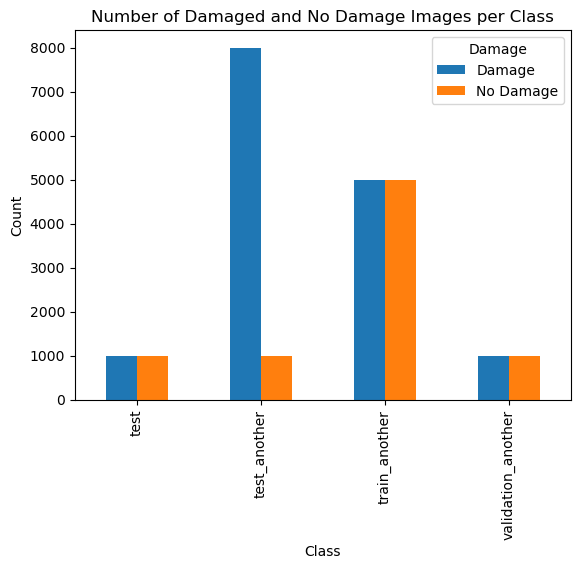

In [127]:
# Count the number of images per class
class_counts = image_df.groupby([ 'data_split','damage']).size().unstack()

# Plotting the bar chart
class_counts.plot(kind='bar',  color=['#1f77b4', '#ff7f0e'])
plt.title('Number of Damaged and No Damage Images per Class')
plt.xlabel('Class')
plt.ylabel('Count')
plt.legend(title='Damage', labels=['Damage', 'No Damage'])
plt.show()

# Image Previews

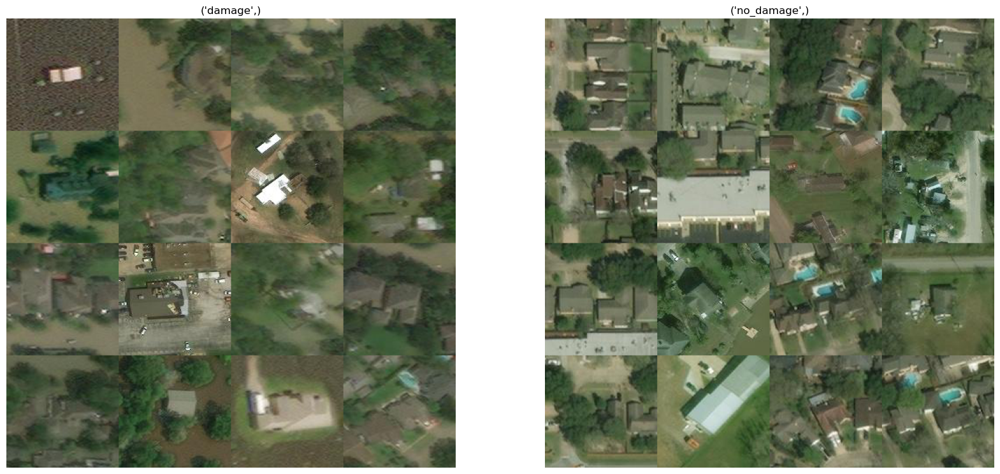

In [62]:
fig, m_axs = plt.subplots(1, 2, figsize=(20, 10))
for c_ax, (c_cat, c_rows) in zip(m_axs, image_df.groupby(['damage'])):
    img_stack = np.stack(c_rows.sample(16)['path'].map(imread), 0)
    c_ax.imshow(montage_rgb(img_stack))
    c_ax.set_title(c_cat)
    c_ax.axis('off')

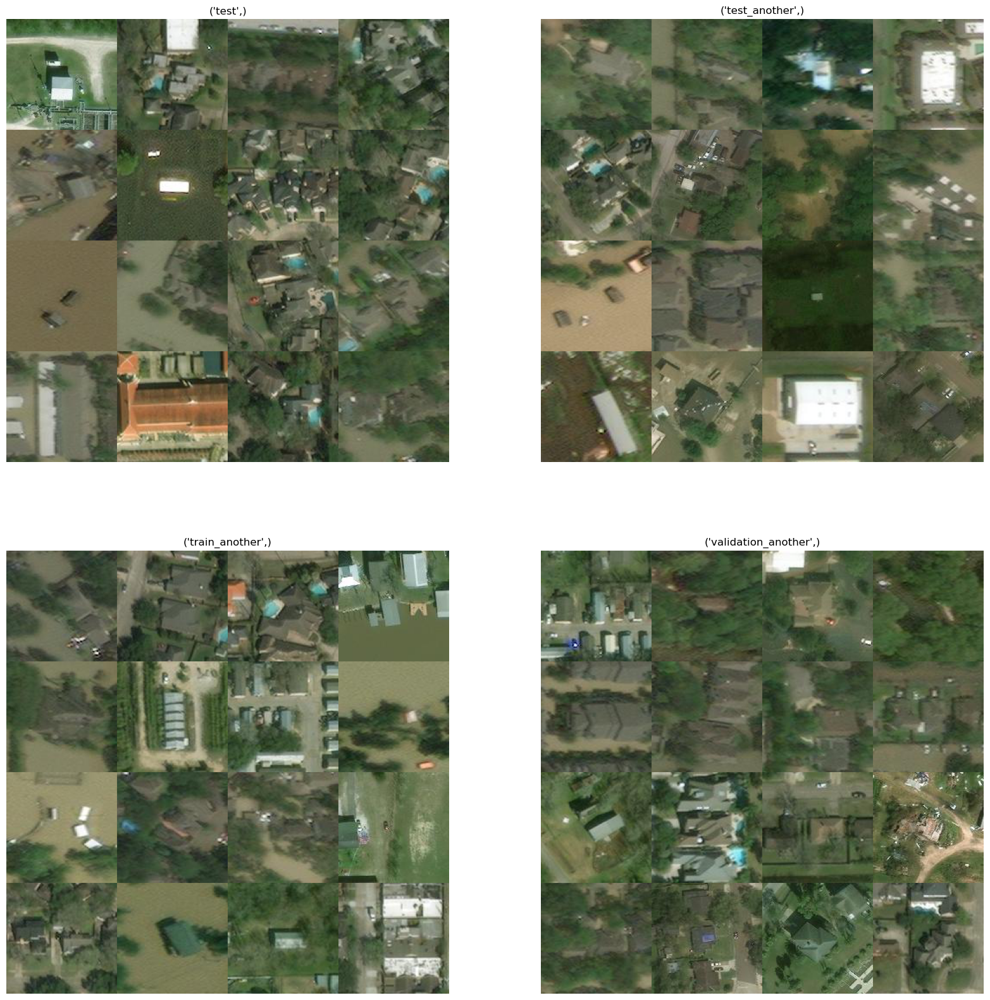

In [63]:
fig, m_axs = plt.subplots(2, 2, figsize=(20, 20))
for c_ax, (c_cat, c_rows) in zip(m_axs.flatten(), image_df.groupby(['data_split'])):
    img_stack = np.stack(c_rows.sample(16)['path'].map(imread), 0)
    c_ax.imshow(montage_rgb(img_stack))
    c_ax.set_title(c_cat)
    c_ax.axis('off')

## Damage vs No Damage 

In [64]:
# training set folder
train_dir = os.path.join(input_path, 'train_another')

# get the list of jpegs from sub image class folders
damage_imgs = [fn for fn in os.listdir(f'{train_dir}/damage') if fn.endswith('.jpeg')]
no_damage_imgs = [fn for fn in os.listdir(f'{train_dir}/no_damage') if fn.endswith('.jpeg')]

# randomly select 3 of each
select_damage = np.random.choice(damage_imgs, 6, replace = False)
select_no_damage = np.random.choice(no_damage_imgs, 6, replace = False)

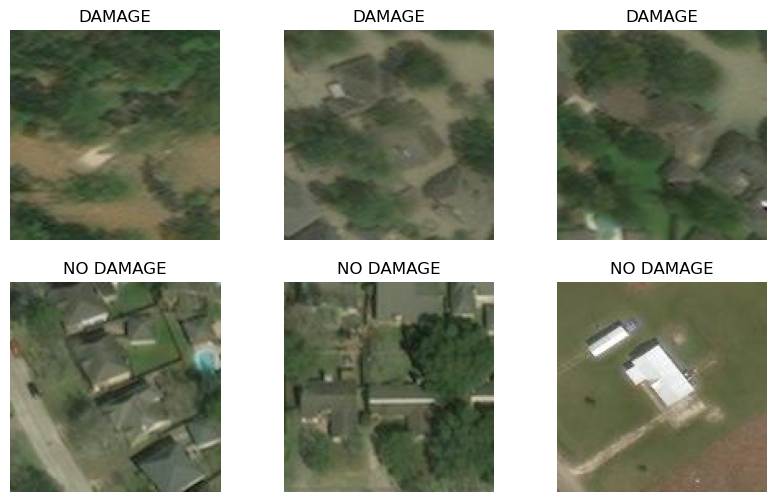

In [65]:
# plotting 2 x 3 image matrix
fig = plt.figure(figsize = (10,6))
for i in range(6):
    if i < 3:
        fp = f'{train_dir}/damage/{select_damage[i]}'
        label = 'DAMAGE'
    else:
        fp = f'{train_dir}/no_damage/{select_no_damage[i-3]}'
        label = 'NO DAMAGE'
    ax = fig.add_subplot(2, 3, i+1)
    
    fn = image.load_img(fp, target_size = (128,128), color_mode='rgb')
    plt.imshow(fn)
    plt.title(label)
    plt.axis('off')
plt.show()

In [66]:
img_df=image_df.copy()
img_df['damage']= np.where(image_df['damage']=='damage',1,0)

In [67]:
img_df

,path,damage,data_split,location,lon,lat
0,../Input/satellite-images-of-hurricane-damage/...,0,test,-95.63609699999999_29.843807,-95.636097,29.843807
1,../Input/satellite-images-of-hurricane-damage/...,0,test,-95.237647_29.559739,-95.237647,29.559739
2,../Input/satellite-images-of-hurricane-damage/...,0,test,-95.63993599999999_29.837821,-95.639936,29.837821
3,../Input/satellite-images-of-hurricane-damage/...,0,test,-95.64638599999999_29.832628000000003,-95.646386,29.832628
4,../Input/satellite-images-of-hurricane-damage/...,0,test,-95.631831_29.849646999999997,-95.631831,29.849647
...,...,...,...,...,...,...
22995,../Input/satellite-images-of-hurricane-damage/...,1,test_another,-93.659805_30.138094,-93.659805,30.138094
22996,../Input/satellite-images-of-hurricane-damage/...,1,test_another,-95.63910200000001_29.838984000000004,-95.639102,29.838984
22997,../Input/satellite-images-of-hurricane-damage/...,1,test_another,-95.613522_29.760151,-95.613522,29.760151
22998,../Input/satellite-images-of-hurricane-damage/...,1,test_another,-93.980652_29.900920000000003,-93.980652,29.900920


# Geographic Distribution

In [106]:
# Filter DataFrame for the training set
train_image_df = image_df[image_df['data_split'] == 'train_another']

# Create GeoDataFrame from the filtered DataFrame
geo_df = gpd.GeoDataFrame(train_image_df, geometry=gpd.points_from_xy(train_image_df.lon, train_image_df.lat))
geo_df = geo_df.set_crs(epsg=4326)

In [107]:
geo_df

,path,damage,data_split,location,lon,lat,geometry
4000,../Input/satellite-images-of-hurricane-damage/...,no_damage,train_another,-95.63609699999999_29.843807,-95.636097,29.843807,POINT (-95.63610 29.84381)
4001,../Input/satellite-images-of-hurricane-damage/...,no_damage,train_another,-95.62683_29.768557,-95.626830,29.768557,POINT (-95.62683 29.76856)
4002,../Input/satellite-images-of-hurricane-damage/...,no_damage,train_another,-95.632397_29.769203000000005,-95.632397,29.769203,POINT (-95.63240 29.76920)
4003,../Input/satellite-images-of-hurricane-damage/...,no_damage,train_another,-95.634153_29.848823,-95.634153,29.848823,POINT (-95.63415 29.84882)
4004,../Input/satellite-images-of-hurricane-damage/...,no_damage,train_another,-95.287635_29.608277,-95.287635,29.608277,POINT (-95.28763 29.60828)
...,...,...,...,...,...,...,...
13995,../Input/satellite-images-of-hurricane-damage/...,damage,train_another,-93.790017_30.128690999999996,-93.790017,30.128691,POINT (-93.79002 30.12869)
13996,../Input/satellite-images-of-hurricane-damage/...,damage,train_another,-93.674249_30.210448,-93.674249,30.210448,POINT (-93.67425 30.21045)
13997,../Input/satellite-images-of-hurricane-damage/...,damage,train_another,-95.15273_30.01897,-95.152730,30.018970,POINT (-95.15273 30.01897)
13998,../Input/satellite-images-of-hurricane-damage/...,damage,train_another,-93.789661_30.12708,-93.789661,30.127080,POINT (-93.78966 30.12708)


In [108]:
# Check the current CRS of the GeoDataFrame
print("Current CRS:", geo_df.crs)

# If the current CRS is not EPSG 4326, you may need to reproject it
if geo_df.crs != 'EPSG:4326':
    geo_df = geo_df.to_crs('EPSG:4326')

# Set CRS to EPSG 3857
geo_df = geo_df.to_crs('EPSG:3857')

# Filter GeoDataFrame for 'damage' and 'no damage'
damage_gdf = geo_df[geo_df['damage'] == 'damage']
no_damage_gdf = geo_df[geo_df['damage'] == 'no_damage'
]

# Check the lengths of the filtered GeoDataFrames
print("Number of points in damage_gdf:", len(damage_gdf))
print("Number of points in no_damage_gdf:", len(no_damage_gdf))

Current CRS: EPSG:4326
Number of points in damage_gdf: 5000
Number of points in no_damage_gdf: 5000


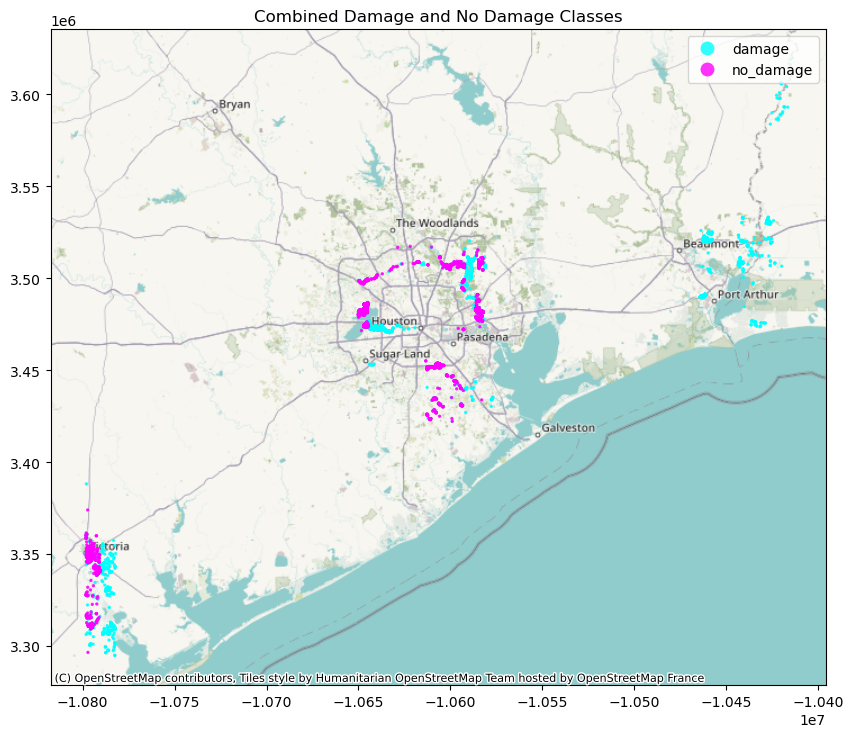

In [109]:
# Combine both GeoDataFrames
combined_gdf = gpd.GeoDataFrame(pd.concat([damage_gdf,no_damage_gdf], ignore_index=True))

# Create a subplot
fig, ax = plt.subplots(figsize=(10, 10))

# Plot combined GeoDataFrame with different marker colors
combined_gdf.plot(ax=ax, column='damage', categorical=True, alpha=0.8, markersize=2, legend=True, cmap='cool', legend_kwds={'loc': 'upper right'})

# Add basemap
cx.add_basemap(ax)

# Set title
plt.title('Combined Damage and No Damage Classes')

# Show the plot
plt.show()

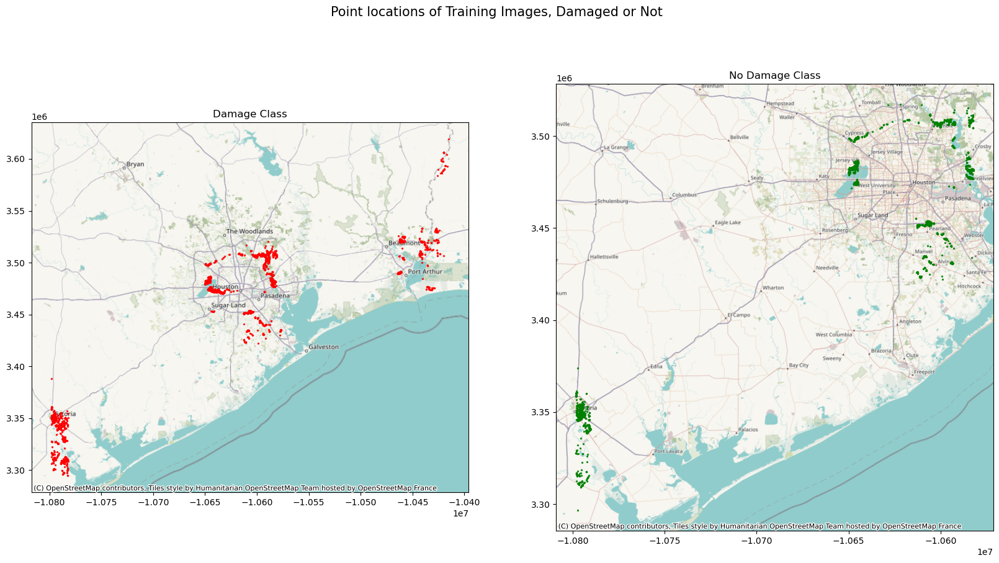

In [110]:
# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(20, 10))

# Plot for 'damage' class with a different color
axs[0] = damage_gdf.plot(ax=axs[0], color='red', alpha=0.8, markersize=2)
cx.add_basemap(axs[0])
axs[0].set_title('Damage Class')

# Plot for 'no damage' class with a different color
axs[1] = no_damage_gdf.plot(ax=axs[1], color='green', alpha=0.8, markersize=2)
cx.add_basemap(axs[1])
axs[1].set_title('No Damage Class')

# Show the plots
plt.suptitle('Point locations of Training Images, Damaged or Not', fontsize=15)
plt.show()


In [80]:
import cv2

# read it in unchanged, to make sure we aren't losing any information
img = cv2.imread(image_df['path'][0], cv2.IMREAD_UNCHANGED)
np.shape(img)

(128, 128, 3)

In [81]:


type(img[0,0,0])



numpy.uint8

In [82]:


np.min(img[:,:,:])



9

In [83]:
np.max(img[:,:,:])

255

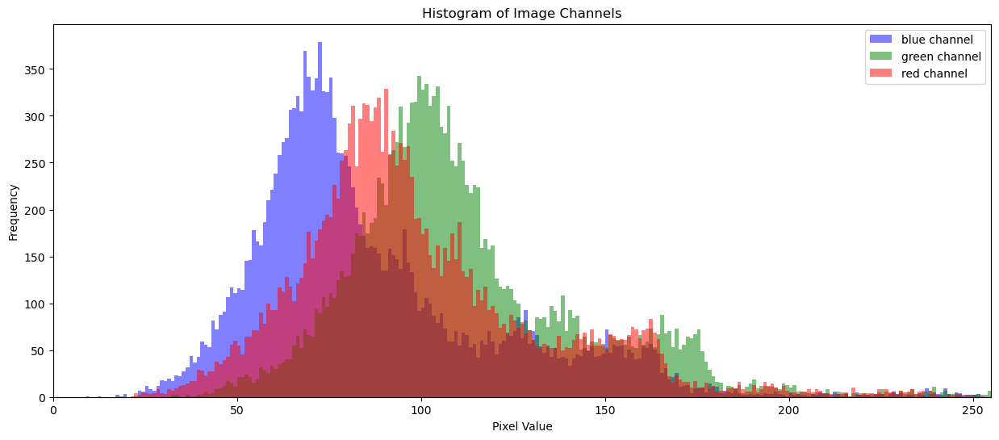

In [84]:
# Define the channels and their corresponding colors
jpg_channels = ['blue', 'green', 'red']
jpg_channel_colors = ['b', 'g', 'r']

# Create a figure and axis for plotting
fig, ax = plt.subplots(figsize=(15, 6))

# Iterate over each channel to plot histograms
for i, channel in enumerate(jpg_channels):
    # Flatten the pixel values of the current channel
    flattened_values = img[:, :, i].flatten()

    # Plot a histogram for the current channel
    ax.hist(
        flattened_values,
        bins=np.arange(256),
        label=f'{channel} channel',  # Set the label for the legend
        color=jpg_channel_colors[i],  # Set the color for the channel
        alpha=0.5  # Set transparency for overlapping histograms
    )
    ax.legend()  # Display the legend

# Set the x-axis limit to the range of pixel values (0 to 255)
ax.set_xlim(0, 255)

# Set labels and title
ax.set_xlabel('Pixel Value')
ax.set_ylabel('Frequency')
ax.set_title('Histogram of Image Channels')

# Display the plot
plt.show(fig)


In [87]:
# get the train-validation-test splits
image_df_train = image_df[image_df['data_split']=='train_another'].copy()
image_df_val = image_df[image_df['data_split']=='validation_another'].copy()
image_df_test = image_df[image_df['data_split']=='test_another'].copy()


In [88]:
# Get paths for training, validation, and test sets
train_path = image_df_train['path'].copy().values
val_path = image_df_val['path'].copy().values
test_path = image_df_test['path'].copy().values

# Create labels for training, validation, and test sets
# Damage is encoded as 1, no damage as 0
train_labels = np.zeros(len(image_df_train), dtype=np.int8)
train_labels[image_df_train['damage'].values == 'damage'] = 1

val_labels = np.zeros(len(image_df_val), dtype=np.int8)
val_labels[image_df_val['damage'].values == 'damage'] = 1

test_labels = np.zeros(len(image_df_test), dtype=np.int8)
test_labels[image_df_test['damage'].values == 'damage'] = 1


In [89]:
# Create TensorFlow Datasets from paths and labels
train_ds = tf.data.Dataset.from_tensor_slices((train_path, train_labels))
val_ds = tf.data.Dataset.from_tensor_slices((val_path, val_labels))
test_ds = tf.data.Dataset.from_tensor_slices((test_path, test_labels))

# Display information about the first 5 samples in the training dataset
for path, label in train_ds.take(5):
    # Decode and print the path
    decoded_path = path.numpy().decode('utf-8')
    print("Image Path: ", decoded_path)

    # Print the label
    print("Label: ", label.numpy())
    print()


Image Path:  ../Input/satellite-images-of-hurricane-damage/train_another/no_damage/-95.63609699999999_29.843807.jpeg
Label:  0

Image Path:  ../Input/satellite-images-of-hurricane-damage/train_another/no_damage/-95.62683_29.768557.jpeg
Label:  0

Image Path:  ../Input/satellite-images-of-hurricane-damage/train_another/no_damage/-95.632397_29.769203000000005.jpeg
Label:  0

Image Path:  ../Input/satellite-images-of-hurricane-damage/train_another/no_damage/-95.634153_29.848823.jpeg
Label:  0

Image Path:  ../Input/satellite-images-of-hurricane-damage/train_another/no_damage/-95.287635_29.608277.jpeg
Label:  0



In [90]:
# Define a function that wraps cv2.imread
# We treat it as a standalone function and use eager execution to get the path string
def cv2_imread(path, label):
    # Read the image using cv2.imread, decode the path, and convert from BGR to RGB
    img = cv2.imread(path.numpy().decode('utf-8'), cv2.IMREAD_UNCHANGED)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img, label

# Define a function for image cleanup using TensorFlow operations
def tf_cleanup(img, label):
    # Convert to Tensor
    img = tf.convert_to_tensor(img)
    # Convert from uint16 to uint8
    img = tf.dtypes.cast(img, tf.uint8)
    # Set the shape of the Tensor
    img.set_shape((128, 128, 3))
    # Convert to float32, scaling from uint8 (0-255) to float32 (0-1)
    img = tf.image.convert_image_dtype(img, tf.float32)
    # Resize the image
    img = tf.image.resize(img, [128, 128])
    # Convert the labels into a Tensor and set the shape
    label = tf.convert_to_tensor(label)
    label.set_shape(())
    return img, label

# Set the number of parallel calls for performance optimization
AUTOTUNE = tf.data.experimental.AUTOTUNE

# Map the cv2 wrapper function using `tf.py_function`
train_ds = train_ds.map(lambda path, label: tuple(tf.py_function(cv2_imread, [path, label], [tf.uint16, label.dtype])),
                        num_parallel_calls=AUTOTUNE)
val_ds = val_ds.map(lambda path, label: tuple(tf.py_function(cv2_imread, [path, label], [tf.uint16, label.dtype])),
                    num_parallel_calls=AUTOTUNE)
test_ds = test_ds.map(lambda path, label: tuple(tf.py_function(cv2_imread, [path, label], [tf.uint16, label.dtype])),
                      num_parallel_calls=AUTOTUNE)

# Map the TensorFlow transformation function - no need to wrap
train_ds = train_ds.map(tf_cleanup, num_parallel_calls=AUTOTUNE)
val_ds = val_ds.map(tf_cleanup, num_parallel_calls=AUTOTUNE)
test_ds = test_ds.map(tf_cleanup, num_parallel_calls=AUTOTUNE)


In [91]:
def rotate_augmentation(img, label):
    # rotate 0, 90, 180, or 270 degrees with 25% probability for each
    img = tf.image.rot90(img, tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32, seed=1111))
    return img, label

def flip_augmentation(img, label):
    # flip with 50% probability for left-right and up-down
    img = tf.image.random_flip_left_right(img, seed=2222)
    img = tf.image.random_flip_up_down(img, seed=3333)
    return img, label

# map the augmentations, creating a new Dataset
augmented_train_ds = train_ds.map(rotate_augmentation, num_parallel_calls=AUTOTUNE)
augmented_train_ds = augmented_train_ds.map(flip_augmentation, num_parallel_calls=AUTOTUNE)

augmented_val_ds = val_ds.map(rotate_augmentation, num_parallel_calls=AUTOTUNE)
augmented_val_ds = augmented_val_ds.map(flip_augmentation, num_parallel_calls=AUTOTUNE)

# concatenate the augmented and original datasets
train_ds = train_ds.concatenate(augmented_train_ds)
val_ds = val_ds.concatenate(augmented_val_ds)

In [92]:
# double the number of samples in the training and validation splits, due to our augmentation procedure
n_train = len(train_labels)*2
n_val = len(val_labels)*2
n_test = len(test_labels)

# shuffle over the entire dataset, seeding the shuffling for reproducible results
train_ds = train_ds.shuffle(n_train, seed=2019, reshuffle_each_iteration=True)
val_ds = val_ds.shuffle(n_val, seed=2019, reshuffle_each_iteration=True)
test_ds = test_ds.shuffle(n_test, seed=2019, reshuffle_each_iteration=True)



In [93]:
n_train_check = 0
for element in train_ds:
    n_train_check = n_train_check + 1
print(n_train_check)



20000


In [94]:
n_val_check = 0
for element in val_ds:
    n_val_check = n_val_check + 1
print(n_val_check)



4000


In [95]:
n_test_check = 0
for element in test_ds:
    n_test_check = n_test_check + 1
print(n_test_check)



9000


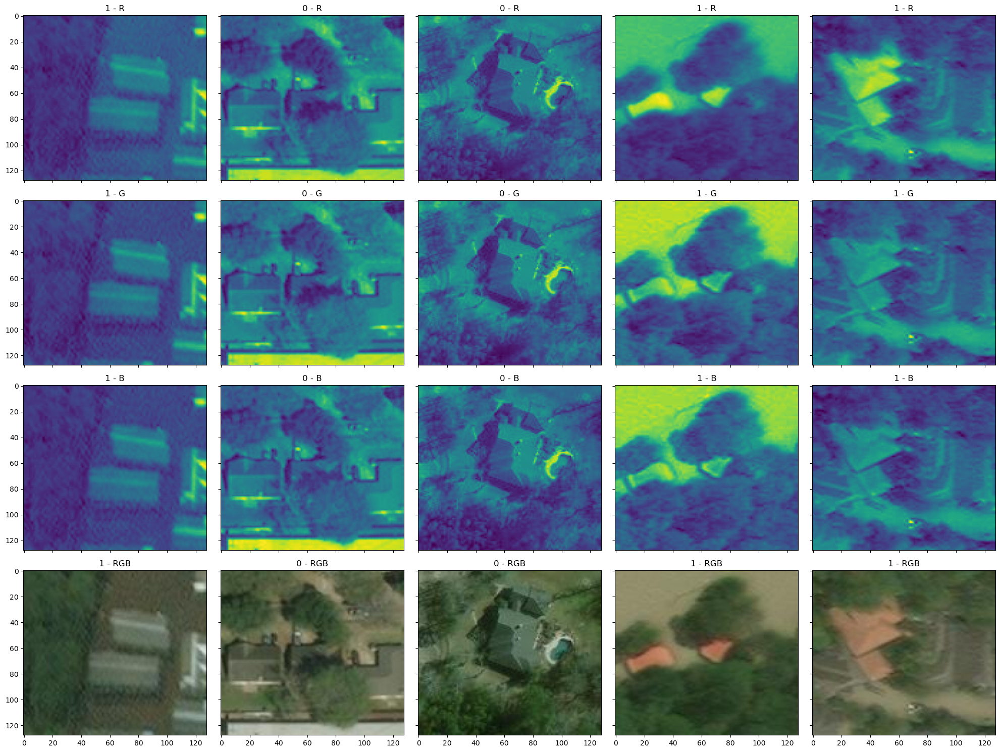

In [96]:
# Create subplots with 4 rows, 5 columns, and a larger figure size
fig, ax = plt.subplots(nrows=4, ncols=5, sharex=True, sharey=True, figsize=(20, 15))

# Initialize a counter for the subplots
i = 0

# Iterate over the first 5 elements in the 'train_ds' dataset
for image, label in train_ds.take(5):
    # Display the red channel in the first row
    ax[0, i].imshow(image[:, :, 0], aspect='auto')
    ax[0, i].set_title('{} - {}'.format(label.numpy(), 'R'))  # Set subplot title
    
    # Display the green channel in the second row
    ax[1, i].imshow(image[:, :, 1], aspect='auto')
    ax[1, i].set_title('{} - {}'.format(label.numpy(), 'G'))  # Set subplot title
    
    # Display the blue channel in the third row
    ax[2, i].imshow(image[:, :, 2], aspect='auto')
    ax[2, i].set_title('{} - {}'.format(label.numpy(), 'B'))  # Set subplot title
    
    # Display the full RGB image in the fourth row
    ax[3, i].imshow(image, aspect='auto')
    ax[3, i].set_title('{} - {}'.format(label.numpy(), 'RGB'))  # Set subplot title

    i = i + 1  # Increment the subplot counter

# Adjust layout for better spacing
plt.tight_layout()

# Show the subplots
plt.show()

